# Reading and Exploring the data

In [1]:
import numpy as np
import pandas as pd

In [2]:
file_path = 'C:/Users/sogor/OneDrive/Documents/DataScientist_practice/car_details.csv'
cars = pd.read_csv(file_path) 

In [3]:
cars.head()

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4


## Data Cleaning process

In [4]:
# Dropping a pointless column
cars = cars.drop(columns=['Levy'], axis=1) 

In [5]:
# Replacing value in the 'Wheel' column for naming convention 
cars['Wheel'] = cars['Wheel'].replace({'Left wheel': 'Left', 'Right-hand drive': 'Right'})

In [6]:
# Replacing values in the 'Door' column and converting to integers
cars['Doors'] = cars['Doors'].replace({'04-May': '4', '02-Mar': '2', '>5': '+5'})

In [7]:
# Removing "km" and converting to integers in the 'Mileage' column
cars['Mileage'] = cars['Mileage'].str.strip(' km').astype(int)

In [8]:
# Converting the 'Cylinders' column to integers
cars['Cylinders'] = cars['Cylinders'].astype(int)

In [9]:
# Removing "Turbo" and converting to float in the 'Engine volume' column
cars['Engine volume'] = cars['Engine volume'].str.replace(' Turbo', '').astype(float) 

In [10]:
# I examine the 'cars' DataFrame and the data types of its columns after the changes
cars

,ID,Price,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005,6,Automatic,4x4,4,Left,Silver,12
1,44731507,16621,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3.0,192000,6,Tiptronic,4x4,4,Left,Black,8
2,45774419,8467,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000,4,Variator,Front,4,Right,Black,2
3,45769185,3607,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966,4,Automatic,4x4,4,Left,White,0
4,45809263,11726,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901,4,Automatic,Front,4,Left,Silver,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,45798355,8467,MERCEDES-BENZ,CLK 200,1999,Coupe,Yes,CNG,2.0,300000,4,Manual,Rear,2,Left,Silver,5
19233,45778856,15681,HYUNDAI,Sonata,2011,Sedan,Yes,Petrol,2.4,161600,4,Tiptronic,Front,4,Left,Red,8
19234,45804997,26108,HYUNDAI,Tucson,2010,Jeep,Yes,Diesel,2.0,116365,4,Automatic,Front,4,Left,Grey,4
19235,45793526,5331,CHEVROLET,Captiva,2007,Jeep,Yes,Diesel,2.0,51258,4,Automatic,Front,4,Left,Black,4


In [11]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19237 entries, 0 to 19236
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                19237 non-null  int64  
 1   Price             19237 non-null  int64  
 2   Manufacturer      19237 non-null  object 
 3   Model             19237 non-null  object 
 4   Prod. year        19237 non-null  int64  
 5   Category          19237 non-null  object 
 6   Leather interior  19237 non-null  object 
 7   Fuel type         19237 non-null  object 
 8   Engine volume     19237 non-null  float64
 9   Mileage           19237 non-null  int32  
 10  Cylinders         19237 non-null  int32  
 11  Gear box type     19237 non-null  object 
 12  Drive wheels      19237 non-null  object 
 13  Doors             19237 non-null  object 
 14  Wheel             19237 non-null  object 
 15  Color             19237 non-null  object 
 16  Airbags           19237 non-null  int64 

In [12]:
# Checking for duplicates
cars.loc[cars.duplicated()]

,ID,Price,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
425,45815372,7840,MERCEDES-BENZ,E 200,1998,Sedan,No,CNG,2.0,180003,4,Manual,Rear,4,Left,Black,4
1581,45815363,8781,TOYOTA,Ist,2002,Hatchback,No,Petrol,1.5,117000,4,Automatic,4x4,4,Right,Red,4
1697,45732125,18503,TOYOTA,Prius,2010,Sedan,No,Petrol,1.8,162000,4,Automatic,Front,4,Left,Grey,12
1972,45507765,20385,MERCEDES-BENZ,CLS 500,2005,Sedan,Yes,Petrol,5.0,230000,8,Tiptronic,Rear,4,Left,Silver,10
2131,45815363,8781,TOYOTA,Ist,2002,Hatchback,No,Petrol,1.5,117000,4,Automatic,4x4,4,Right,Red,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18974,45815465,2352,LEXUS,IS 350,2015,Sedan,Yes,Petrol,3.5,80856,6,Automatic,4x4,4,Left,Black,12
19137,45810466,15125,CHEVROLET,Orlando,2012,Jeep,Yes,Diesel,2.0,156834,4,Automatic,Front,4,Left,Golden,4
19200,45725908,36065,MERCEDES-BENZ,CLA 250 AMG,2013,Sedan,Yes,Petrol,2.0,68000,4,Tiptronic,Front,4,Left,Red,12
19203,45761487,13485,TOYOTA,Prius,2011,Sedan,No,Hybrid,1.8,281600,6,Automatic,Front,4,Left,Grey,8


In [13]:
# Dropping duplicates
cars = cars.drop_duplicates()

## Checking for missing values 

In [14]:
cars.isnull().sum()

ID                  0
Price               0
Manufacturer        0
Model               0
Prod. year          0
Category            0
Leather interior    0
Fuel type           0
Engine volume       0
Mileage             0
Cylinders           0
Gear box type       0
Drive wheels        0
Doors               0
Wheel               0
Color               0
Airbags             0
dtype: int64

Looks like there are no missing values, which is awesome.

## Creating a new column named Country

In [15]:
# Going trough the Brand of the cars
cars['Manufacturer'].unique() 

array(['LEXUS', 'CHEVROLET', 'HONDA', 'FORD', 'HYUNDAI', 'TOYOTA',
       'MERCEDES-BENZ', 'OPEL', 'PORSCHE', 'BMW', 'JEEP', 'VOLKSWAGEN',
       'AUDI', 'RENAULT', 'NISSAN', 'SUBARU', 'DAEWOO', 'KIA',
       'MITSUBISHI', 'SSANGYONG', 'MAZDA', 'GMC', 'FIAT', 'INFINITI',
       'ALFA ROMEO', 'SUZUKI', 'ACURA', 'LINCOLN', 'VAZ', 'GAZ',
       'CITROEN', 'LAND ROVER', 'MINI', 'DODGE', 'CHRYSLER', 'JAGUAR',
       'ISUZU', 'SKODA', 'DAIHATSU', 'BUICK', 'TESLA', 'CADILLAC',
       'PEUGEOT', 'BENTLEY', 'VOLVO', 'სხვა', 'HAVAL', 'HUMMER', 'SCION',
       'UAZ', 'MERCURY', 'ZAZ', 'ROVER', 'SEAT', 'LANCIA', 'MOSKVICH',
       'MASERATI', 'FERRARI', 'SAAB', 'LAMBORGHINI', 'ROLLS-ROYCE',
       'PONTIAC', 'SATURN', 'ASTON MARTIN', 'GREATWALL'], dtype=object)

In [16]:
# Checking the size of the dataset before
cars.shape

(18924, 17)

In [17]:
# Deleting rows where the Manufacturer is 'სხვა', because there is no car named like this
cars = cars[cars['Manufacturer'] != 'სხვა']

In [18]:
# # Checking the size of the dataset after
cars.shape

(18922, 17)

In [19]:
# Creating a dictionary that holds the car brands.
origin = {
    'LEXUS': 'Japan', 
    'CHEVROLET': 'United States of America', 
    'HONDA': 'Japan', 
    'FORD': 'United States of America', 
    'HYUNDAI': 'South Korea', 
    'TOYOTA': 'Japan',
    'MERCEDES-BENZ': 'Germany', 
    'OPEL': 'Germany',
    'PORSCHE': 'Germany', 
    'BMW': 'Germany', 
    'JEEP': 'United States of America', 
    'VOLKSWAGEN': 'Germany',
    'AUDI': 'Germany',
    'RENAULT': 'France', 
    'NISSAN': 'Japan', 
    'SUBARU': 'Japan',
    'DAEWOO': 'South Korea', 
    'KIA': 'South Korea',
    'MITSUBISHI': 'Japan', 
    'SSANGYONG': 'South Korea', 
    'MAZDA': 'Japan', 
    'GMC': 'United States of America', 
    'FIAT': 'Italy', 
    'INFINITI': 'Japan',
    'ALFA ROMEO': 'Italy', 
    'SUZUKI': 'Japan', 
    'ACURA': 'Japan', 
    'LINCOLN': 'United States of America',
    'VAZ': 'Russia', 
    'GAZ': 'Russia',
    'CITROEN': 'France',
    'LAND ROVER': 'United Kingdom',
    'MINI': 'United Kingdom', 
    'DODGE': 'United States of America',
    'CHRYSLER': 'United States of America', 
    'JAGUAR': 'United Kingdom',
    'ISUZU': 'Japan', 
    'SKODA': 'Czech Republic', 
    'DAIHATSU': 'Japan',
    'BUICK': 'United States of America', 
    'TESLA': 'United States of America', 
    'CADILLAC': 'United States of America',
    'PEUGEOT': 'France', 
    'BENTLEY': 'United Kingdom', 
    'VOLVO': 'Sweden', 
    'HAVAL': 'China',
    'HUMMER': 'United States of America', 
    'SCION': 'United States of America',
    'UAZ': 'Russia',
    'MERCURY': 'United States of America', 
    'ZAZ': 'Ukraine', 
    'ROVER': 'United Kingdom', 
    'SEAT': 'Spain', 
    'LANCIA': 'Italy',
    'MOSKVICH': 'Russia',
    'MASERATI': 'Italy', 
    'FERRARI': 'Italy', 
    'SAAB': 'Sweden', 
    'LAMBORGHINI': 'Italy',
    'ROLLS-ROYCE': 'United Kingdom',
    'PONTIAC': 'United States of America', 
    'SATURN': 'United States of America', 
    'ASTON MARTIN': 'United Kingdom',
    'GREATWALL': 'China'
}

In [20]:
# Creating a new 'Country' column using the 'origin' dictionary
cars.loc[:, 'Country'] = cars['Manufacturer'].map(origin)

In [21]:
# Viewing a sample of my dataset
cars.sample(10)

,ID,Price,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags,Country
2043,45792167,18440,KIA,Cadenza,2011,Sedan,Yes,Petrol,2.7,110823,6,Automatic,Front,4,Left,Black,4,South Korea
11452,45810425,627,MINI,Cooper S Cabrio,2013,Hatchback,Yes,Petrol,1.6,134035,4,Automatic,Front,4,Left,Red,12,United Kingdom
3988,45762228,4547,CHEVROLET,Volt,2012,Hatchback,Yes,Hybrid,1.4,162190,4,Automatic,Front,4,Left,Blue,0,United States of America
12442,45792474,18189,KIA,Optima,2016,Sedan,Yes,Petrol,2.0,27485,4,Automatic,Front,4,Left,Black,4,South Korea
8918,45792250,30734,MERCEDES-BENZ,Sprinter,2003,Microbus,No,Diesel,2.7,116000,5,Tiptronic,Rear,2,Left,White,4,Germany
11181,45786239,20385,TOYOTA,Prius,2012,Hatchback,No,Hybrid,1.8,59000,4,Automatic,Front,4,Left,Black,10,Japan
8189,45759895,23521,TOYOTA,Estima,2009,Minivan,No,Hybrid,2.4,155000,4,Automatic,4x4,4,Right,Silver,0,Japan
16212,45635087,9408,VOLKSWAGEN,Jetta,2012,Sedan,Yes,Diesel,2.0,119619,4,Automatic,Front,4,Left,Black,12,Germany
3504,45792370,7213,OPEL,Astra,2000,Hatchback,No,Petrol,1.6,215000,4,Automatic,Front,2,Left,Silver,0,Germany
10159,44961447,14740,TOYOTA,Corolla,2007,Sedan,No,Petrol,1.6,179000,4,Tiptronic,Front,4,Left,Grey,0,Japan


In [22]:
# I'll check to see if there is any row in the 'Country' column that has been left empty.
cars['Country'].isnull().sum()

0

# Visualzation the data

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

### Prices of cars across different categories

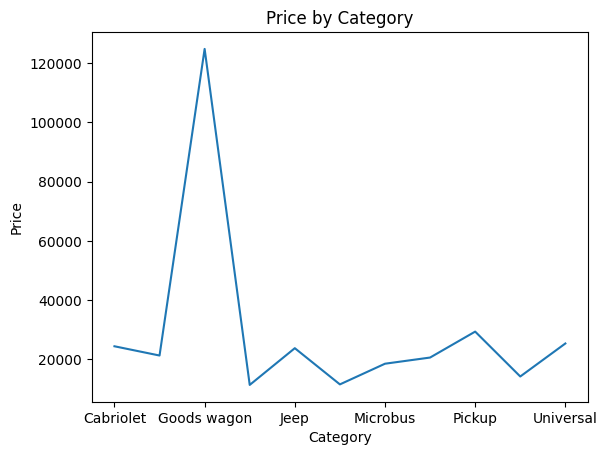

In [24]:
cars.groupby('Category')['Price'].mean().plot.line()
plt.title('Price by Category')
plt.ylabel("Price")
plt.show()

There seems to be a significant peak in the 'Goods wagon' category, which surprises me. Initially, I thought Cabriolet would be the winner.

### Average Price per top7 Manufacturers 

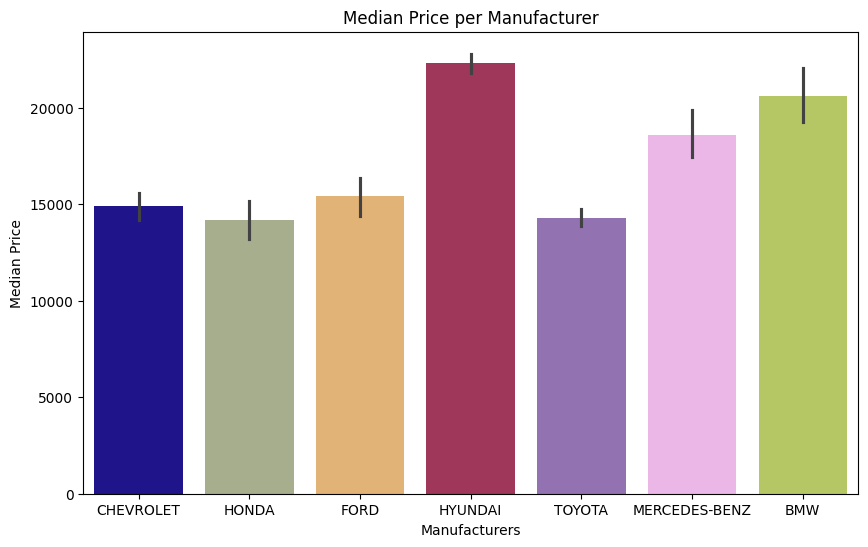

In [25]:
top_manufacturers = cars['Manufacturer'].value_counts().nlargest(7).index
my_colors = ["#11009E", "#A9B388", "#F3B664", "#AF2655", "#9467bd", "#F2AFEF", "#BED754"]
plt.figure(figsize=(10, 6))
sns.barplot(x='Manufacturer', y='Price', hue='Manufacturer', data=cars[cars['Manufacturer'].isin(top_manufacturers)], estimator='mean', palette=my_colors, legend=False)
plt.title('Median Price per Manufacturer')
plt.xlabel('Manufacturers')
plt.ylabel('Median Price')
plt.show()

We can notice that Hyundai has the highest average price among all the manufacturers and surprisingly comes before German elite cars like BMW and Mercedes.

### Distribution of Drive Wheel types

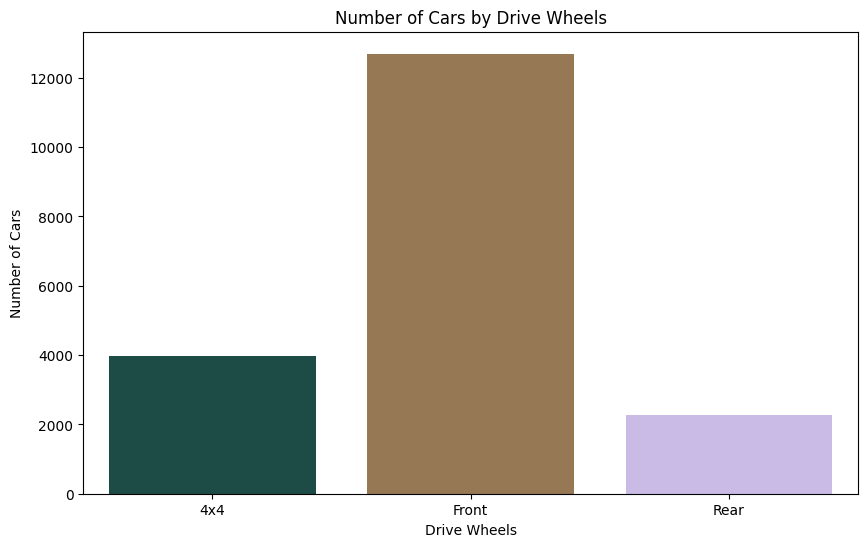

In [26]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Drive wheels', data=cars, hue='Drive wheels', palette='cubehelix', legend=False)
plt.title('Number of Cars by Drive Wheels')
plt.xlabel('Drive Wheels')
plt.ylabel('Number of Cars')
plt.show()

As I expected, most cars have a 'Front' drive wheel, and the 'Rear' version is used less frequently.

### Distribution of Car Categories 

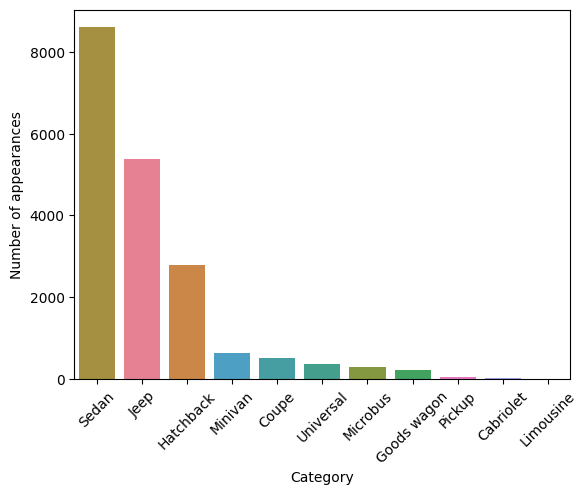

In [27]:
category_counts = cars['Category'].value_counts().index

# Use a palette with enough distinct colors for each category
my_color_palette = sns.color_palette("husl", n_colors=len(category_counts))

# Plot the countplot with specified palette and order
sns.countplot(x='Category', hue='Category', data=cars, palette=my_color_palette, order=category_counts)
plt.ylabel('Number of appearances')
plt.xticks(rotation=45)
plt.show()

The most loved category of cars is 'Sedan' by far, and, of course, 'Limousine' is the least preferred, as that category is typically reserved for special occasions.

### Distribution of Fuel types

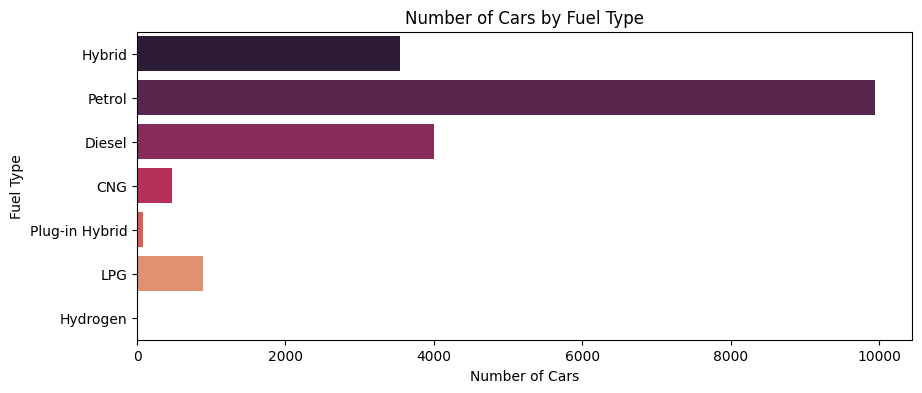

In [28]:
plt.figure(figsize=(10, 4))
sns.countplot(y='Fuel type', hue='Fuel type', data=cars, palette='rocket')
plt.title('Number of Cars by Fuel Type')
plt.xlabel('Number of Cars')
plt.ylabel('Fuel Type')
plt.show()

'Petrol' stands out as the most commonly used fuel by far, and in recent years, the 'Hybrid' version has almost surpassed 'Diesel'.

### Color preferences 

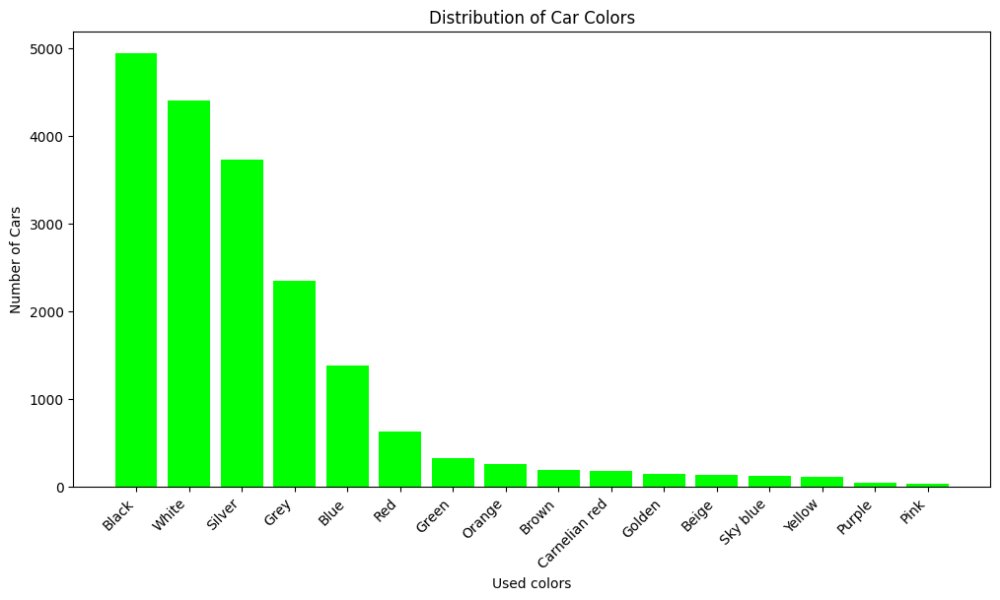

In [29]:
color_counts = cars['Color'].value_counts()

# Plotting the bar chart 
plt.figure(figsize=(12, 6))
plt.bar(color_counts.index, color_counts, color='lime')
plt.title('Distribution of Car Colors')
plt.xlabel('Used colors')
plt.ylabel('Number of Cars')
plt.xticks(rotation=45, ha='right')
plt.show()

We can observe that the most used colors on a car is 'black' and 'white' which are the default colors for the majority of cars, so nothing surprising.

### Distribution of Doors & Gear Boxes & Wheel types 

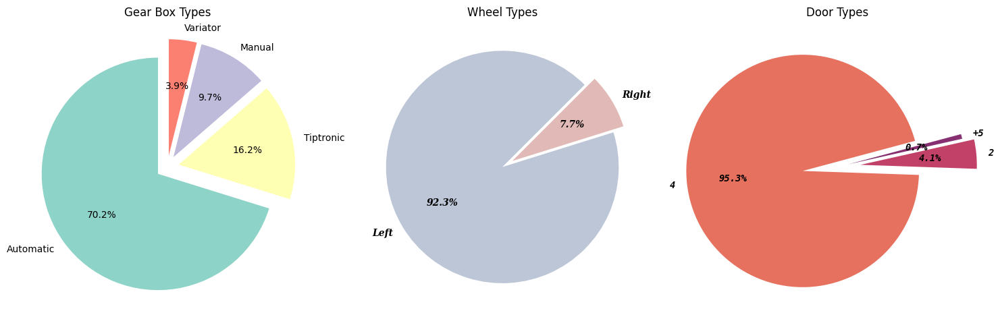

In [30]:
# Plotting Gear Box Types
gearbox_counts = cars['Gear box type'].value_counts()
used_colors_gearbox = sns.color_palette("Set3", n_colors=len(gearbox_counts))
my_explode_gearbox = [0.1, 0.1, 0.1, 0.1]

# Plotting Wheel Types
wheel_counts = cars['Wheel'].value_counts()
colors_wheel = sns.color_palette("vlag", n_colors=len(wheel_counts))
my_explode_wheel = [0, 0.1]

# Plotting Door Types
door_counts = cars['Doors'].value_counts()
colors_door = sns.color_palette("flare", n_colors=len(door_counts))
my_explode_door = [0.3, 0.2, 0.1]

# Create a 1x3 grid for subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plotting each pie chart
axs[0].pie(gearbox_counts, labels=gearbox_counts.index, autopct='%1.1f%%', colors=used_colors_gearbox, explode=my_explode_gearbox, startangle=90)
axs[0].set_title('Gear Box Types')

axs[1].pie(wheel_counts, labels=wheel_counts.index, autopct='%1.1f%%', colors=colors_wheel, explode=my_explode_wheel, startangle=45, textprops={'family': 'serif', 'style': 'italic', 'weight': 'bold'})
axs[1].set_title('Wheel Types')

axs[2].pie(door_counts, labels=door_counts.index, autopct='%1.1f%%', colors=colors_door, startangle=15, explode=my_explode_door, textprops={'family': 'monospace', 'style': 'italic', 'weight': 'bold'})
axs[2].set_title('Door Types')

# Adjust layout to prevent clipping of titles
plt.tight_layout()

# Show the plot
plt.show()

We can notice that: 
- The most preferred option is 'Automatic,' indicating that most people prefer not to switch between gears. :))
- Based on uniformity, it can be stated that left-hand steering is preferred by people.
- The majority of the cars have 4 doors and less than 1% have 5 or more doors.

### Histograms about numerical columns

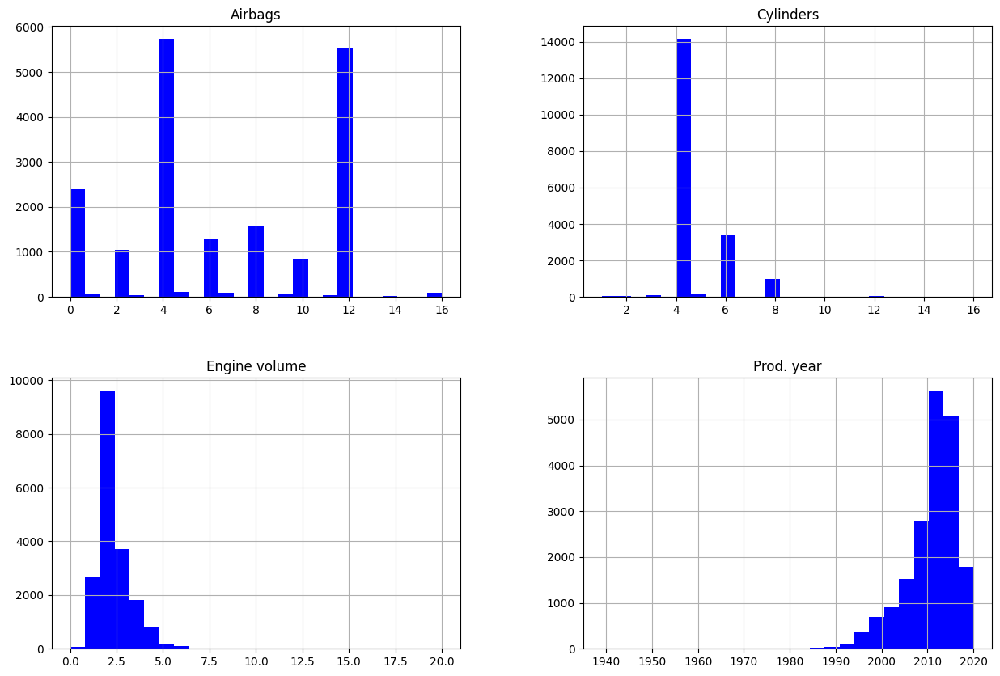

In [31]:
# Exclude 'Price', 'Mileage' columns from the histogram figure, because it seemed to be skewed perhaps because of outliers.
numeric_columns = cars.select_dtypes(include=['int', 'float']).columns.difference(['ID', 'Price', 'Mileage'])

# Plot histograms for numeric columns
cars[numeric_columns].hist(bins=25, figsize=(15, 10), color='blue')
plt.show()

We can have the following conclusions:
- Most cars are equipped with 4 and 12 airbags.
- Still, the 4-cylinder one is the most popular.
- The majority of engines have between 1 and 3 cylinders.
- The majority of productions were around 2010. Also, we can observe a growing trend from 1990 up to approximately 2012-2013, and from 2015, there is a decline

### Top10 Manufacturers  

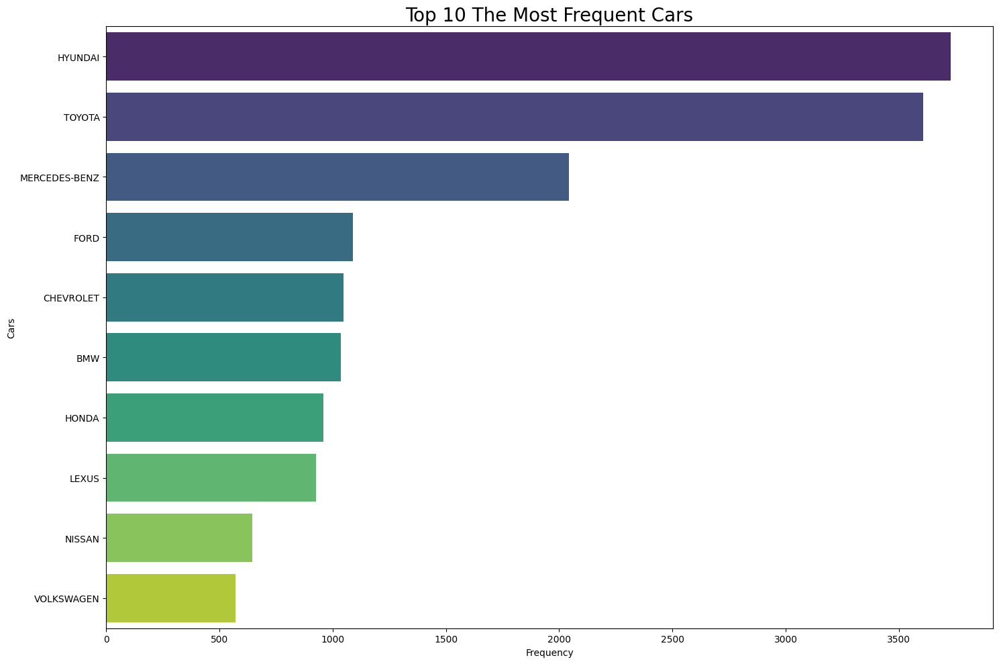

In [32]:
top_10_cars = cars['Manufacturer'].value_counts().sort_values(ascending=False)[:10]

plt.figure(figsize=(15, 10))
sns.barplot(x=top_10_cars, y=top_10_cars.index, hue=top_10_cars.index, palette='viridis', linewidth=4)
plt.title('Top 10 The Most Frequent Cars', loc='center', fontsize=20)
plt.xlabel('Frequency')
plt.ylabel('Cars')
plt.tight_layout()
plt.show()

The leaders are from Asia, with the two giants Hyundai and Toyota. Surprisingly, Volkswagen hardly makes the top 10 list, although everyone says those cars are for all people :))

### Top3 Models from the two Manufacturer leaders

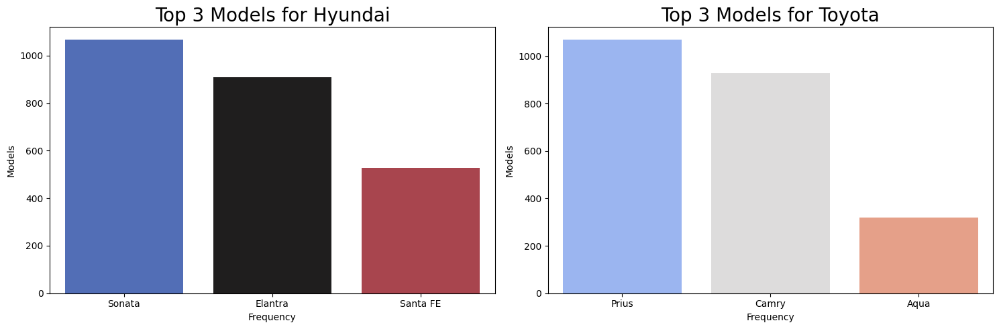

In [33]:
# Filter the DataFrame for Hyundai and Toyota
hyundai_data = cars[cars['Manufacturer'] == 'HYUNDAI']
toyota_data = cars[cars['Manufacturer'] == 'TOYOTA']

# Get the top 3 models for Hyundai
top_3_hyundai_models = hyundai_data['Model'].value_counts().head(3)

# Get the top 3 models for Toyota
top_3_toyota_models = toyota_data['Model'].value_counts().head(3)

# Plotting the bar charts side by side
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
sns.barplot(x=top_3_hyundai_models.index, y=top_3_hyundai_models.values, hue=top_3_hyundai_models.index, palette='icefire', legend=False)
plt.title('Top 3 Models for Hyundai', fontsize=20)
plt.xlabel('Frequency')
plt.ylabel('Models')

plt.subplot(1, 2, 2)
sns.barplot(x=top_3_toyota_models.index, y=top_3_toyota_models.values, hue=top_3_toyota_models.index, palette='coolwarm', legend=False)
plt.title('Top 3 Models for Toyota', fontsize=20)
plt.xlabel('Frequency')
plt.ylabel('Models')

plt.tight_layout()
plt.show()

### Treemap of cars by Manufacturer, Category and Model

In [34]:
import plotly.express as px

In [35]:
fig = px.treemap(data_frame=cars, path=["Manufacturer", "Category", "Model"], title='Cars Distribution by Manufacturer, Category, and Model')
fig.show()

This map helps to get an overview of which categories are preferred by each manufacturer.

### Exploring Total Sales by Manufacturer, Category and Model

In [36]:
fig2 = px.treemap(data_frame=cars, path=["Manufacturer", "Category", "Model"], values='Price', title='Price Breakdown Across Manufacturer, Category and Model')
fig2.show()

This map helps to provide an overview of the unveiling price variations across each company.

### Distribution  of Prices

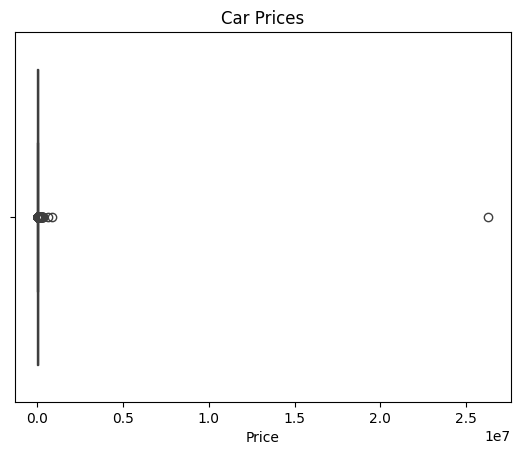

In [37]:
sns.boxplot(data=cars, x="Price")

# Add title and show the plot
plt.title('Car Prices')
plt.show()

If the 'Price' values are wildly different, it can affect the boxplot. That's why I look at the distribution of values.

In [38]:
print(cars['Price'].describe())

count    1.892200e+04
mean     1.858758e+04
std      1.921458e+05
min      1.000000e+00
25%      5.331000e+03
50%      1.317200e+04
75%      2.206300e+04
max      2.630750e+07
Name: Price, dtype: float64


### Year variety 

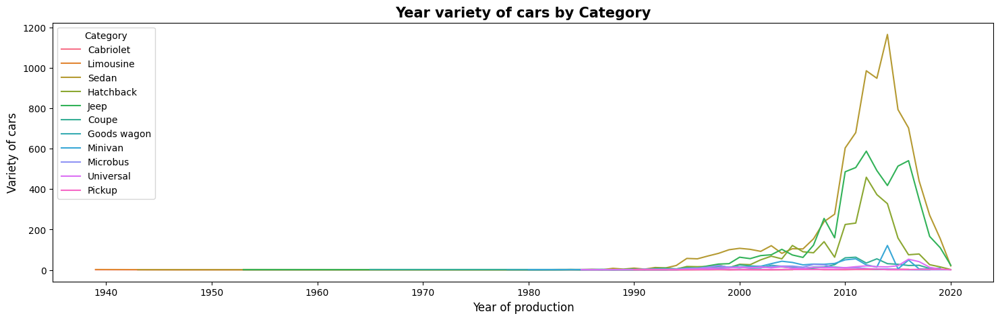

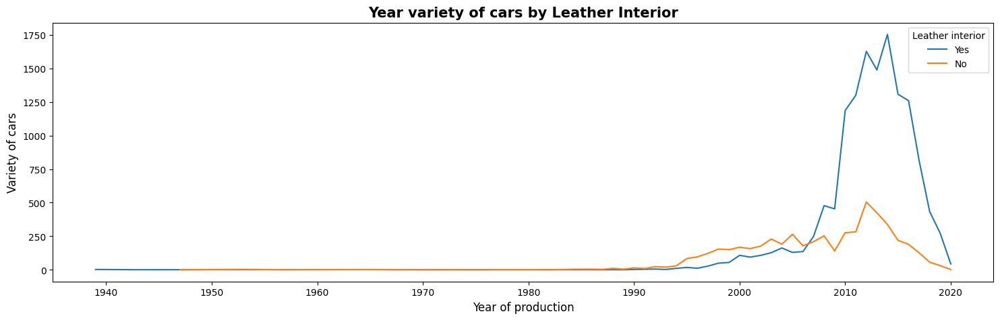

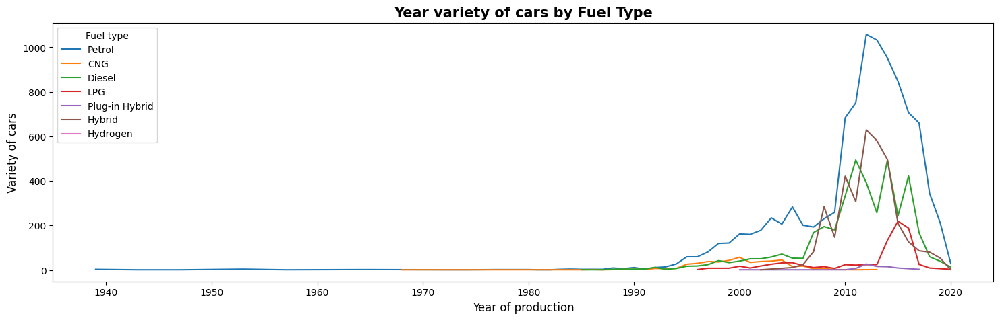

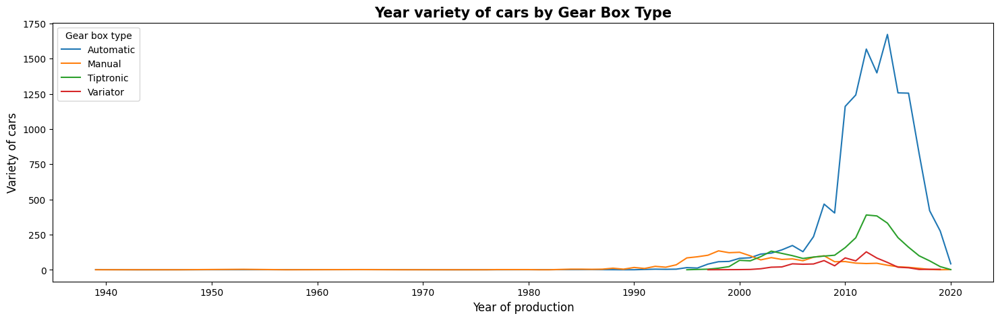

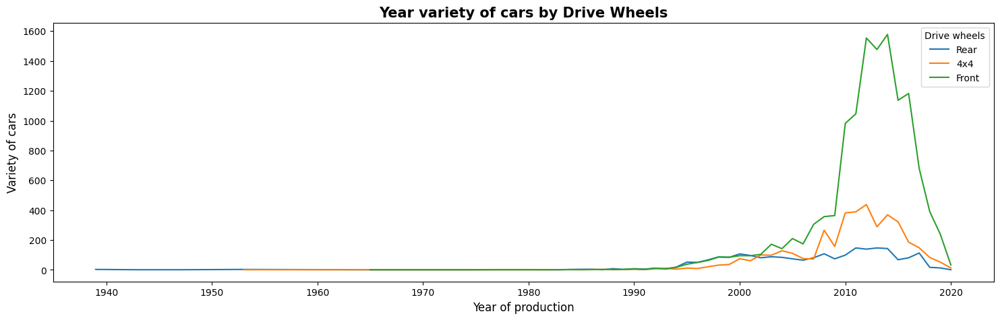

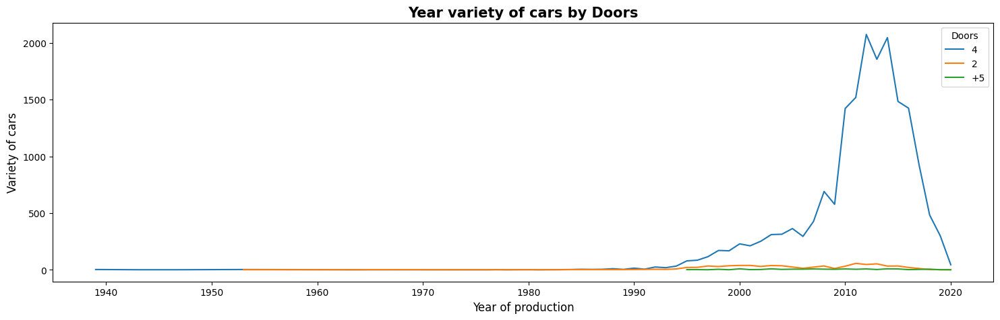

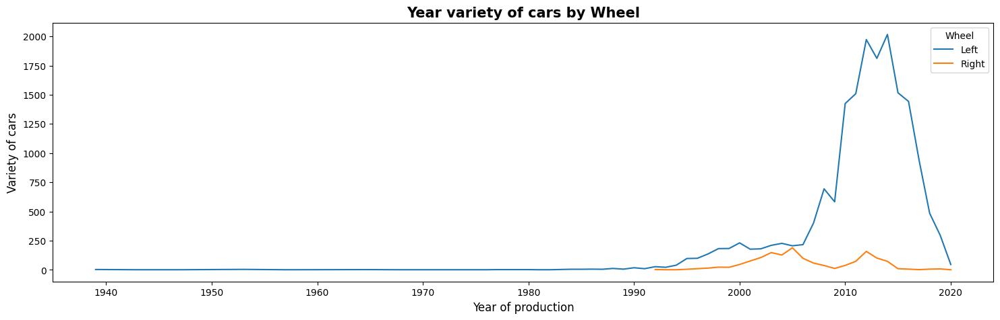

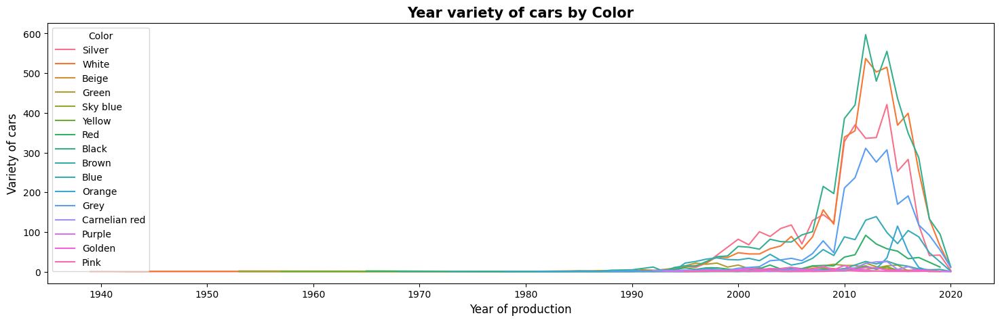

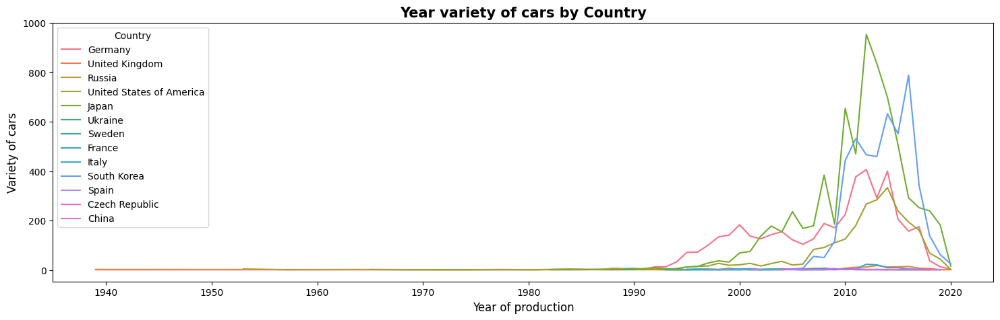

In [39]:
non_numeric_data = cars.select_dtypes(include=object)
# I remove these columns because they were not easily distinguishable on the chart.
non_numeric_data = non_numeric_data.drop(columns=['Manufacturer', 'Model'])

for item in non_numeric_data:
    plt.figure(figsize=(18,5))
    carsA = cars[['Prod. year', item, 'Price']].groupby(by= ['Prod. year', item], as_index=True).count().reset_index()
    plot = sns.lineplot(x='Prod. year', y='Price',  data = carsA, hue = item)
    plt.title(f'Year variety of cars by {item.title()}', fontsize=15, weight='bold')
    plt.xlabel('Year of production', fontsize=12)  
    plt.ylabel('Variety of cars', fontsize=12) 
    plt.show()

Based on the description of the 'Price' column, it can be seen that the prices are in a very wide range, including very high values (the maximum value is, for example, 26 million). In addition, the standard deviation (std) is also large, indicating that the variance between prices is significant. Therefore I consider that log transformation can help me better represent my data over a wide range.

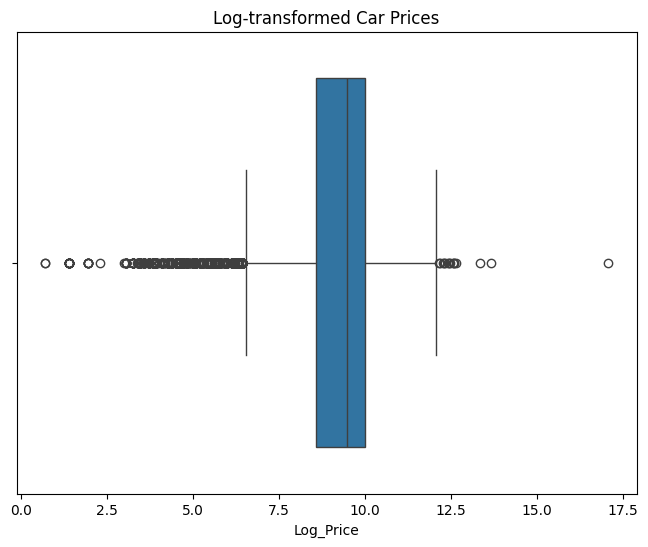

In [40]:
log_transformed_prices = np.log1p(cars['Price'])
log_prices_df = pd.DataFrame({'Log_Price': log_transformed_prices})

# Create a boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Log_Price', data=log_prices_df, orient='h')
plt.title('Log-transformed Car Prices')
plt.show()

In [41]:
# After the log transformation, the unit of measurement for price became logarithmic.
# Technically, the transformed values represent the logarithm (base e, natural logarithm) of the original prices.

- The median log-transformed price is about 9.5, whose non-transformed value is e^(9.5) ≈ 13359.7268297
- There are many outliers outside the box whiskers. From this, we can conclude that the least expensive car is approximately 1, whose non-transformed value is e^(1) ≈ 2.71828 and the most expensive car is around 17, whose non-transformed value is e^(17) ≈ 2.4155*10^7. 
- However, KEEP IN MIND that these values are not equivalent to the non-transformed prices because the spread of prices appears more compressed on the log scale.

### Kernel Density Estimate of Logarithmic Prices

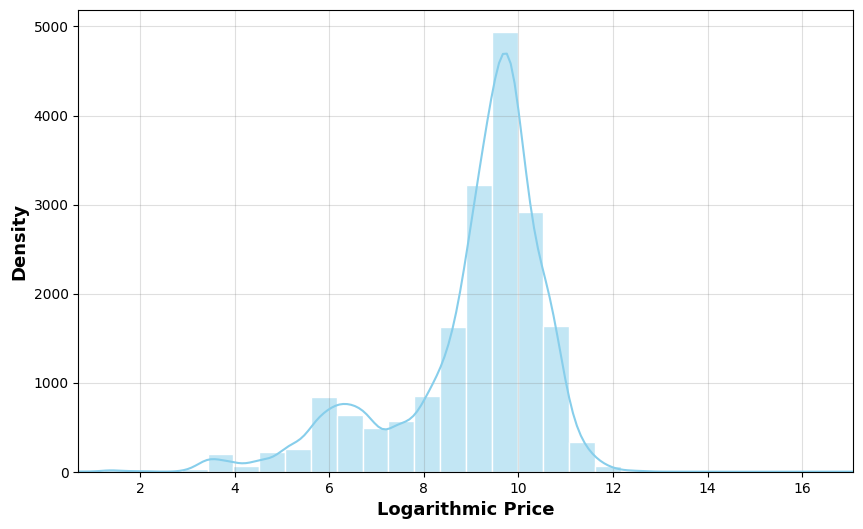

In [42]:
fig, ax = plt.subplots(figsize=(10, 6))

# Plot histogram
sns.histplot(log_prices_df['Log_Price'], bins=30, kde=True, color='skyblue', edgecolor='white', ax=ax)

# Customize the plot
ax.set_xlabel('Logarithmic Price', fontweight='bold', fontsize=13)
ax.set_ylabel('Density', fontweight='bold', fontsize=13)
ax.grid(color='grey', alpha=0.25)
ax.set_xlim(log_prices_df['Log_Price'].min(), log_prices_df['Log_Price'].max())

# Show the plot
plt.show()

The peak in the KDE plot indicates the most common logarithmic price range in the dataset. The width of the KDE plot gives an indication of the spread or variability in logarithmic prices. As we can see the plot is asymmetrical, it suggests skewness in the original price distribution. 

### Distribution of Mileages 

In [43]:
# I do the same with 'Mileage' column as well, because the issue is the same as it was before
# The values are widly different and log transformation can help me better represent my data over a wide range

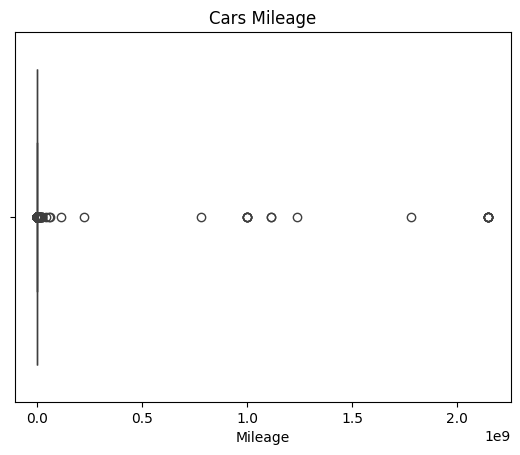

In [44]:
sns.boxplot(data=cars, x="Mileage")

# Add title and show the plot
plt.title('Cars Mileage')
plt.show()

In [45]:
print(cars['Mileage'].describe())

count    1.892200e+04
mean     1.555514e+06
std      4.880478e+07
min      0.000000e+00
25%      7.019525e+04
50%      1.264000e+05
75%      1.890780e+05
max      2.147484e+09
Name: Mileage, dtype: float64


- The mean mileage is approximately 1.56 million.
- The minimum mileage is 0, which is unusual for a measure of distance traveled. It might indicate missing or invalid data, or some cars with zero recorded mileage.
- The standard deviation is quite large, approximately 48.8 million.
- The maximum mileage is 2.15 billion, which is an extremely high value.
- 75% of the data points have a mileage of 189,078 or less.
- The median mileage is 126,400.
- 25% of the data points have a mileage of 70,195 or less.

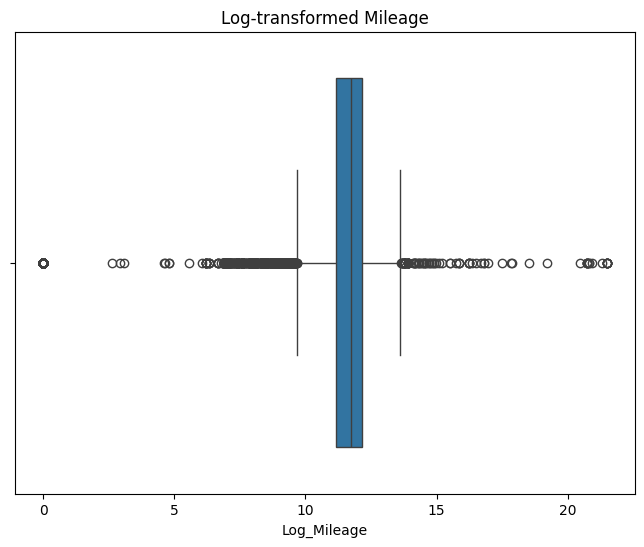

In [46]:
log_transformed_mileage = np.log1p(cars['Mileage'])
log_mileage_df = pd.DataFrame({'Log_Mileage': log_transformed_mileage})

# Create a boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Log_Mileage', data=log_mileage_df, orient='h')
plt.title('Log-transformed Mileage')
plt.show()

In [47]:
# After the log transformation, the unit of measurement for mileage became logarithmic.
# Technically, the transformed values represent the logarithm (base e, natural logarithm) of the original mileages.

- The median log-transformed mileage is about 12, whose non-transformed value is e^(12) ≈ 162754.79142 km.
- There are many outliers outside the box whiskers. From this, we can conclude that the lowest mileage is 0 (likely indicating a new car ==> e^(0) = 1 km), and the highest mileage is around 23, whose non-transformed value is e^(23) ≈ 9.7448*10^9 km.
- However, KEEP IN MIND that these values are not equivalent to the non-transformed prices because the spread of prices appears more compressed on the log scale.

### Prices Distribution across Fuel Types and Gearbox Types

In [48]:
# Log-transform the 'Price' column
log_transformed_prices = np.log1p(cars['Price'])
cars['Log_Price'] = log_transformed_prices

# Create a notched box plot using Plotly Express
fig = px.box(cars, x='Fuel type', y='Log_Price', color='Gear box type', notched=True)

# Update layout for better visualization
fig.update_layout(
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    yaxis_title='Log-transformed Price'
)

fig.show()

- Observing this graph, we can notice that the most expensive car is a manual diesel car, whose price converted back into the non-transformed price would be e^(17.08536) ≈ 2.63074×10^7. Following this pattern, the cheapest car is a manual petrol car, and its price converted back into the non-transformed price would be e^(0.6931472) ≈ 2. 
- For each case, you can read from the graph the maximum, minimum, median, Q3, and Q1 values of cars.
- Assuming the currency for prices is in dollars ($), but this is just a hypothesis.

### Mileage Distribution across Gear Box Types and colored by Fuel Type 

In [49]:
log_transformed_mileage = np.log1p(cars['Mileage'])
cars['Log_Mileage'] = log_transformed_mileage

# Create a violin plot
fig = px.violin(cars, y="Log_Mileage", x="Gear box type", color="Fuel type", box=True, points="all", hover_data=cars.columns)
fig.show()

The violins show the kernel density estimation, and the box plots provide additional statistics for each category. Individual data points are also visible for detailed inspection.
This graph can provide insights into the reliability of cars based on these factors.
- More consistent and narrower distribution may indicate a more reliable performance.
- A higher box indicates a higher median log-transformed mileage, which can be associated with better reliability. Shorter whiskers suggest less variability in the data, potentially indicating more consistent performance.
- Outliers may represent cars with unusually high or low mileage compared to the majority in a category. Fewer outliers may indicate more reliable performance.

### Distribution of cars with and without leather interior

In [50]:
FTCH = cars['Leather interior'].value_counts(ascending=True)

# Pivot table to calculate the probability of having leather interior for each unique 'Manufacturer'
probability_of_leather = cars.pivot_table(values='Leather interior', index=['Manufacturer'], aggfunc = lambda x:x.map({'Yes' : 1, 'No' : 0}).mean())

In [51]:
use_leather = []
not_use_leather = []

for manufacturer, row in probability_of_leather.iterrows():
    if row['Leather interior'] == 1:
        use_leather.append(manufacturer)
    elif row['Leather interior'] == 0:
        not_use_leather.append(manufacturer)

print("Manufacturers who don't use leather for the interior at all.")
for brand in not_use_leather:
    print(brand)

print("\n")

print("Manufacturers who use leather for interior every time.")
for brand in use_leather:
    print(brand)

Manufacturers who don't use leather for the interior at all.
GREATWALL
MOSKVICH
PONTIAC
SATURN
SCION
SEAT
SKODA


Manufacturers who use leather for interior every time.
ASTON MARTIN
BENTLEY
CADILLAC
FERRARI
GMC
HAVAL
LAMBORGHINI
LANCIA
MASERATI
MERCURY
ROLLS-ROYCE
SSANGYONG
TESLA


In [52]:
leather_price_summary = (
    pd.DataFrame(cars.groupby('Leather interior').Price.agg(['mean', 'median', 'max']))
        .rename(columns=lambda col: f'{col}_price', 
                index=lambda idx: 'Yes' if idx else 'No')
)

leather_price_summary

,mean_price,median_price,max_price
Leather interior,,,
Yes,18414.023498,11604.0,26307500
Yes,18653.205972,14113.0,872946


The analysis reveals that, on average, cars with leather interiors tend to have a slightly higher mean price compared to those without leather interiors. Additionally, the median price for cars with leather interiors is higher than for cars without leather interiors. The maximum price for cars with leather interiors is substantially higher than for cars without leather interiors.
- In summary, while cars with leather interiors generally have higher prices.

In [53]:
pd.DataFrame(
    cars['Prod. year'].aggregate(['min', 'mean', 'median', 'max'])
)

,Prod. year
min,1939.000000
mean,2010.914755
median,2012.000000
max,2020.000000


- The earliest car was made in 1939.
- The average production year was 2010.
- Median provides an indication of the central tendency.
- Latest production year was 2020.
- Skew indicates that the distribution is skewed to the left, meaning there are more cars with production years earlier than the average (median).

### Production overview 

In [54]:
print('No. of cars produced before the turn of the century: ', cars[cars['Prod. year'] < 2000].shape[0])

print("\n")

print('No. of cars produced after the Peak of production: ', cars[cars['Prod. year'] > 2010].shape[0])

print('\nNewest cars on sale', '-'*25, sep='\n')
(
    cars[cars['Prod. year'] > 2015][['Manufacturer', 'Model', 'Prod. year', 'Price']]
    .sort_values(by='Prod. year')
    .head(10) 
    .reset_index(drop=True)
)

No. of cars produced before the turn of the century:  962


No. of cars produced after the Peak of production:  12475

Newest cars on sale
-------------------------


,Manufacturer,Model,Prod. year,Price
0,HYUNDAI,Santa FE,2016,39493
1,PORSCHE,Cayenne,2016,29166
2,MERCEDES-BENZ,G 550,2016,1882
3,HYUNDAI,Elantra,2016,18503
4,SSANGYONG,Actyon,2016,33230
5,TOYOTA,RAV 4,2016,40000
6,HYUNDAI,H1,2016,40183
7,HYUNDAI,Elantra,2016,21953
8,HYUNDAI,Santa FE,2016,53154
9,HYUNDAI,Sonata,2016,10349


## Prediction part

In [55]:
cars['Price'] = cars['Log_Price']
cars['Mileage'] = cars['Log_Mileage']
cars = cars.drop(['Log_Price', 'Log_Mileage'], axis=1)

# I will exclude the 'ID' column from the statistical overview
cars.drop('ID', axis=1).describe()

,Price,Prod. year,Engine volume,Mileage,Cylinders,Airbags
count,18922.000000,18922.000000,18922.000000,18922.000000,18922.000000,18922.000000
mean,9.028916,2010.914755,2.306252,11.168588,4.580277,6.568914
std,1.585203,5.665814,0.877637,2.429781,1.200271,4.322234
min,0.693147,1939.000000,0.000000,0.000000,1.000000,0.000000
25%,8.581482,2009.000000,1.800000,11.159050,4.000000,4.000000
50%,9.485925,2012.000000,2.000000,11.747215,4.000000,6.000000
75%,10.001703,2015.000000,2.500000,12.149920,4.000000,12.000000
max,17.085365,2020.000000,20.000000,21.487563,16.000000,16.000000


By normalizing, I try to remove the differences in size between the data, thus allowing the machine learning models to work more efficiently.
Columns like 'Price' and  'Mileage' might benefit from log normalization to handle the wide range of values. I'm not going to normalize it again, because I did it at a previous visualization. 

In [56]:
# Checking again if there are missing values
cars.isnull().sum()

ID                  0
Price               0
Manufacturer        0
Model               0
Prod. year          0
Category            0
Leather interior    0
Fuel type           0
Engine volume       0
Mileage             0
Cylinders           0
Gear box type       0
Drive wheels        0
Doors               0
Wheel               0
Color               0
Airbags             0
Country             0
dtype: int64

In [57]:
cars.dtypes

ID                    int64
Price               float64
Manufacturer         object
Model                object
Prod. year            int64
Category             object
Leather interior     object
Fuel type            object
Engine volume       float64
Mileage             float64
Cylinders             int32
Gear box type        object
Drive wheels         object
Doors                object
Wheel                object
Color                object
Airbags               int64
Country              object
dtype: object

Because data that is not numerical is usually not directly usable for machine learning models. In order for the models to be able to use them, they have to be converted into numerical form.

In [58]:
non_numeric_data = cars.select_dtypes(include=object)
numeric_data = cars.select_dtypes(exclude=object)

In [59]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder()

#OneHotEncoder for all non-numeric columns
non_numeric_data_encoded = pd.get_dummies(non_numeric_data)
# Convert the encoded columns to integers
non_numeric_data_encoded = non_numeric_data_encoded.astype(int)

# Concatenate the new encoded columns with the original numeric columns
cars_encoded = pd.concat([numeric_data, non_numeric_data_encoded], axis=1)

In [60]:
cars_encoded

,ID,Price,Prod. year,Engine volume,Mileage,Cylinders,Airbags,Manufacturer_ACURA,Manufacturer_ALFA ROMEO,Manufacturer_ASTON MARTIN,...,Country_Germany,Country_Italy,Country_Japan,Country_Russia,Country_South Korea,Country_Spain,Country_Sweden,Country_Ukraine,Country_United Kingdom,Country_United States of America
0,45654403,9.497697,2010,3.5,12.133534,6,12,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,44731507,9.718482,2011,3.0,12.165256,6,8,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,45774419,9.044050,2006,1.3,12.206078,4,2,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,45769185,8.190909,2011,2.5,12.037459,4,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,45809263,9.369649,2014,1.3,11.428478,4,4,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,45798355,9.044050,1999,2.0,12.611541,4,5,0,0,0,...,1,0,0,0,0,0,0,0,0,0
19233,45778856,9.660269,2011,2.4,11.992886,4,8,0,0,0,...,0,0,0,0,1,0,0,0,0,0
19234,45804997,10.170035,2010,2.0,11.664496,4,4,0,0,0,...,0,0,0,0,1,0,0,0,0,0
19235,45793526,8.581482,2007,2.0,10.844646,4,4,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [61]:
backup = cars_encoded.copy()

X = cars_encoded.drop('Price', axis=1)
y = cars_encoded['Price']

In [62]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [63]:
algorithm = ['LinearRegression','DecisionTreeClassifier','RandomForestClassifier','GradientBoostingRegressor','SVR']
R2 = []
RMSE = [] 

In [74]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.metrics import r2_score, mean_squared_error

def prediction_models(model_name, model):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    R2.append(r2)
    RMSE.append(rmse)
    
    print(f'Model: {model_name}')
    print(f'R-squared: {r2}')
    print(f'Residual Mean Squared Error (RMSE): {rmse}\n')

In [75]:
model1 = LinearRegression()
model2 = KNeighborsRegressor()
model3 = DecisionTreeRegressor()
model4 = SVR()
model5 = RandomForestRegressor()
model6 = GradientBoostingRegressor()

In [76]:
models = {
    'Linear Regression': model1,
    'K-Nearest Neighbors': model2,
    'Decision Tree': model3,
    'Support Vector Regression': model4,
    'Random Forest': model5,
    'Gradient Boosting': model6
}

for name, model in models.items():
    prediction_models(name, model)

Model: Linear Regression
R-squared: 0.26348641050543953
Residual Mean Squared Error (RMSE): 1.3691063059344308

Model: K-Nearest Neighbors
R-squared: 0.24803811627372496
Residual Mean Squared Error (RMSE): 1.3833902233162878

Model: Decision Tree
R-squared: 0.4596965434465192
Residual Mean Squared Error (RMSE): 1.1726425843923851

Model: Support Vector Regression
R-squared: -0.08447662063853945
Residual Mean Squared Error (RMSE): 1.6613337408351452

Model: Random Forest
R-squared: 0.6792690262001266
Residual Mean Squared Error (RMSE): 0.9034772888665312

Model: Gradient Boosting
R-squared: 0.47171032879043917
Residual Mean Squared Error (RMSE): 1.1595322933723795



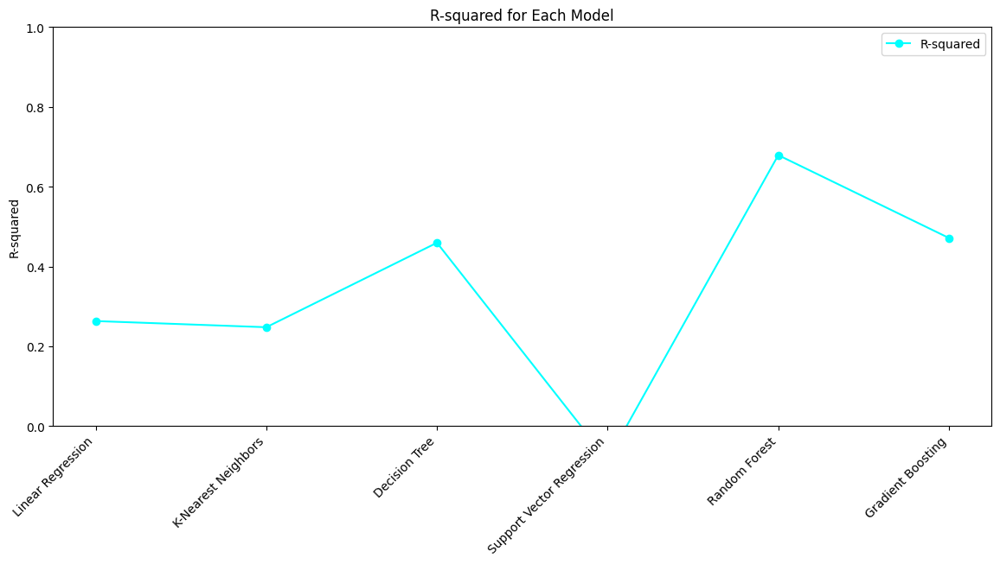

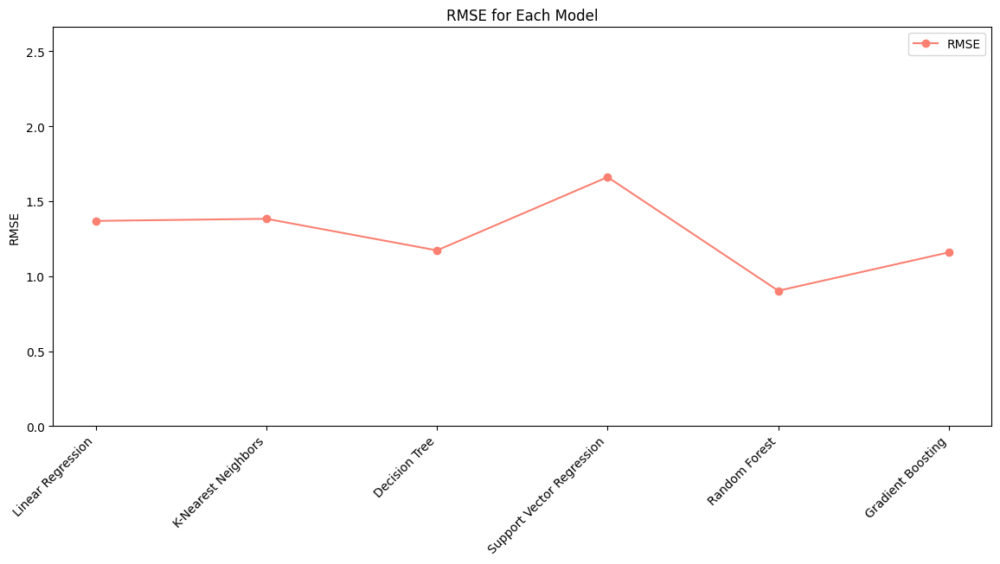

In [77]:
plt.figure(figsize=(14, 6))
plt.plot(models.keys(), R2, marker='o', color='cyan', label='R-squared')
plt.title('R-squared for Each Model')
plt.ylabel('R-squared')
plt.ylim(0, 1)
plt.legend()
plt.xticks(rotation=45, ha='right')  
plt.show()

# Plotting RMSE
plt.figure(figsize=(14, 6))
plt.plot(models.keys(), RMSE, marker='o', color='salmon', label='RMSE')
plt.title('RMSE for Each Model')
plt.ylabel('RMSE')
plt.ylim(0, max(RMSE) + 1)
plt.legend()
plt.xticks(rotation=45, ha='right')  
plt.show()